In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import os
import math

In [2]:
parent_dir = os.path.dirname(os.getcwd())
# Path to the Density_profiles directory
density_profiles_dir =  "Density_profiles"

# Count the number of files in the directory

def load_df(num):
    name = os.path.join( "Density_profiles", num)
    df = pd.read_csv(name,delimiter = " ")
    nperiod = (list(df.columns)[-1])
    df.drop(columns=[nperiod],inplace=True)
    nperiod = int(nperiod)
    return df,nperiod


def cut_density_windows(df, width,L,window_stack,center_values):
    n_windows = int(L/width)
    window_dim = int(np.sqrt(len(df))/n_windows)


    rhomatrix = df.pivot(index='y', columns='x', values='rho').values
    mulocmatrix = df.pivot(index='y', columns='x', values='muloc').values
    for i in range(n_windows):
        for j in range(n_windows):
            window = rhomatrix[i*window_dim:(i+1)*window_dim,j*window_dim:(j+1)*window_dim]
            window_stack.append(window)
            center_x_index = int((i+0.5)*window_dim)
            center_y_index = int((j+0.5)*window_dim)
            center = mulocmatrix[center_x_index,center_y_index]
            center_values.append(center)

    return window_stack,center_values


In [3]:
names= [f for f in os.listdir(density_profiles_dir) if os.path.isfile(os.path.join(density_profiles_dir, f))]
print(names[0])

rho_MC_2D_seed99.dat


/home/hagen/miniconda3/envs/neural_func/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/hagen/miniconda3/envs/neural_func/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/hagen/miniconda3/envs/neural_func/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/hagen/miniconda3/envs/neural_func/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/hagen/miniconda3/envs/neural_func/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, 

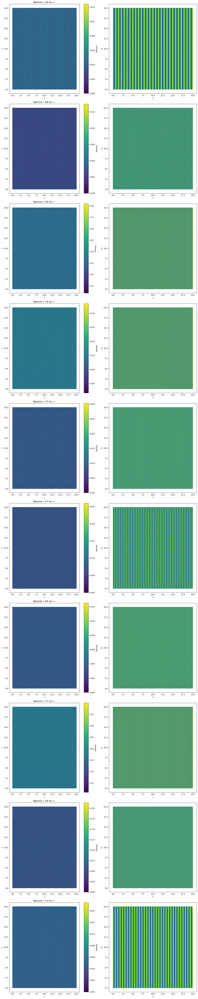

In [4]:
window_stack = []
value_stack = []
rows = len(names[:10])
cols = 2

fig, axs = plt.subplots(rows, cols, figsize=(15, 75))

for i,names in enumerate(names[:10]):
    df,nperiod = load_df(names)
    # Get the number of rows and columns in the DataFrame
    df["muloc"]=np.log(df["rho"])+df["muloc"]
    axs[i, 0].scatter(df["x"], df["y"], c=df["rho"], s=0.5)
    axs[i,0].set_title("Nperiod = "+str(nperiod)+" mu = ")
    axs[i,0].set_xlabel("x")
    axs[i,0].set_ylabel("y")
    axs[i, 1].scatter(df["x"], df["y"], c=df["muloc"], s=0.5)

    axs[i, 1].set_xlabel("x")
    axs[i, 1].set_ylabel("c1")

    fig.colorbar(axs[i, 0].collections[0], ax=axs[i, 0], label="Density")
plt.tight_layout()
plt.show()    

